# Read phytoplankton data and add functional group info

In [2]:
library(tidyverse, warn.conflicts = FALSE)
library(cowplot, warn.conflicts = FALSE)
library(scales, warn.conflicts = FALSE)

# library to read matlab data formats into R
library(reshape2)
library(lubridate)

In [4]:
library(worrms)

In [5]:
ds <- read.csv("../../DATA/Phytoplankton_newest_full.csv")

ds$Datetime_UTC = parse_date_time(ds$Datetime_UTC, orders = "%Y-%m-%d H:M:S")
ds$Datetime_local = parse_date_time(ds$Datetime_local, orders = "%Y-%m-%d H:M:S")

ds$date = ds$Datetime_UTC

In [6]:
str(ds[ds$AphiaID<1,])

'data.frame':	1172 obs. of  28 variables:
 $ unlimited              : int  172 202 470 500 767 797 1064 1094 1362 1392 ...
 $ Cruise                 : int  1 1 2 2 3 3 4 4 5 5 ...
 $ Cruise_ID_2            : chr  "CAR-001" "CAR-001" "CAR-002" "CAR-002" ...
 $ Leg                    : int  2 2 1 1 1 1 1 1 1 1 ...
 $ Cast                   : int  2 2 2 2 3 3 4 4 4 4 ...
 $ Day_local              : int  8 8 13 13 12 12 13 13 13 13 ...
 $ Month_local            : int  11 11 12 12 1 1 2 2 3 3 ...
 $ Year_local             : int  1995 1995 1995 1995 1996 1996 1996 1996 1996 1996 ...
 $ Latitude               : num  10.5 10.5 10.5 10.5 10.5 ...
 $ Longitude              : num  -64.7 -64.7 -64.7 -64.7 -64.7 ...
 $ Time_start_local       : chr  "03:36" "03:36" "04:11" "04:11" ...
 $ Time_end_local         : chr  "03:54" "03:54" "04:50" "04:50" ...
 $ Datetime_local         : POSIXct, format: "1995-11-08 03:36:00" "1995-11-08 03:36:00" ...
 $ Datetime_UTC           : POSIXct, format: "1995-11-08

In [7]:
str(ds)

'data.frame':	96841 obs. of  28 variables:
 $ unlimited              : int  0 1 2 3 4 5 6 7 8 9 ...
 $ Cruise                 : int  1 1 1 1 1 1 1 1 1 1 ...
 $ Cruise_ID_2            : chr  "CAR-001" "CAR-001" "CAR-001" "CAR-001" ...
 $ Leg                    : int  2 2 2 2 2 2 2 2 2 2 ...
 $ Cast                   : int  2 2 2 2 2 2 2 2 2 2 ...
 $ Day_local              : int  8 8 8 8 8 8 8 8 8 8 ...
 $ Month_local            : int  11 11 11 11 11 11 11 11 11 11 ...
 $ Year_local             : int  1995 1995 1995 1995 1995 1995 1995 1995 1995 1995 ...
 $ Latitude               : num  10.5 10.5 10.5 10.5 10.5 ...
 $ Longitude              : num  -64.7 -64.7 -64.7 -64.7 -64.7 ...
 $ Time_start_local       : chr  "03:36" "03:36" "03:36" "03:36" ...
 $ Time_end_local         : chr  "03:54" "03:54" "03:54" "03:54" ...
 $ Datetime_local         : POSIXct, format: "1995-11-08 03:36:00" "1995-11-08 03:36:00" ...
 $ Datetime_UTC           : POSIXct, format: "1995-11-08 07:36:00" "1995-11-08 07

In [28]:
#ds[ds$SpeciesNameCleaned=="Thalassiosira sp.",]$Total_sum
head(unique(ds$ScientificName_accepted), n=640)

[1] "Acanthoica sp."                                
  [2] "Akashiwo sanguinea"                            
  [3] "Alexandrium cohorticula"                       
  [4] "Alexandrium monilatum"                         
  [5] "Alexandrium sp."                               
  [6] "Alexandrium tamarense"                         
  [7] "Algirosphaera robusta"                         
  [8] "Amphidinium schroederi"                        
  [9] "Amphidinium sp."                               
 [10] "Amphora sp."                                   
 [11] "Anabaena sp."                                  
 [12] "Anacystis sp."                                 
 [13] "Asterionella frauenfeldii"                     
 [14] "Asterionellopsis glacialis"                    
 [15] "Asterodinium spinosum"                         
 [16] "Asterolampra sp."                              
 [17] "Asteromphalus flabellatus"                     
 [18] "Bacillariophyceae"                             
 [19] "Bacteriastrum delicatulum"                     
 [20] "Bacteriastrum elongatum"                       
 [21] "Bacteriastrum hyalinum"                        
 [22] "Bacteriastrum sp."                             
 [23] "Bleakeleya notata"                             
 [24] "Blepharocysta splendor-maris"                  
 [25] "Brachidinium sp."                              
 [26] "Brachiomonas sp."                              
 [27] "Calcidiscus sp."                               
 [28] "Calciopappus caudatus"                         
 [29] "Calciosolenia brasiliensis"                    
 [30] "Calciosolenia murrayi"                         
 [31] "Campylodiscus sp."                             
 [32] "Centrodinium sp."                              
 [33] "Cerataulina pelagica"                          
 [34] "Cerataulus sp."                                
 [35] "Ceratium teres"                                
 [36] "Ceratium trichoceros"                          
 [37] "Ceratium tripos "                              
 [38] "Ceratoperidinium falcatum"                     
 [39] "Chaetoceros affinis"                           
 [40] "Chaetoceros atlanticus"                        
 [41] "Chaetoceros breve"                             
 [42] "Chaetoceros coarctatus"                        
 [43] "Chaetoceros compressus"                        
 [44] "Chaetoceros concavicornis"                     
 [45] "Chaetoceros constrictus"                       
 [46] "Chaetoceros costatus"                          
 [47] "Chaetoceros curvisetus"                        
 [48] "Chaetoceros danicus"                           
 [49] "Chaetoceros debilis"                           
 [50] "Chaetoceros decipiens"                         
 [51] "Chaetoceros dichaeta"                          
 [52] "Chaetoceros didymus"                           
 [53] "Chaetoceros gracilis"                          
 [54] "Chaetoceros laciniosus"                        
 [55] "Chaetoceros lauderi"                           
 [56] "Chaetoceros lorenzianus"                       
 [57] "Chaetoceros messanensis"                       
 [58] "Chaetoceros pelagicus"                         
 [59] "Chaetoceros pendulus"                          
 [60] "Chaetoceros pseudocurvisetum"                  
 [61] "Chaetoceros radicans"                          
 [62] "Chaetoceros socialis"                          
 [63] "Chaetoceros sp."                               
 [64] "Chaetoceros subtilis"                          
 [65] "Chaetoceros teres"                             
 [66] "Chaetoceros tetrastichon"                      
 [67] "Chaetoceros tortissimus"                       
 [68] "Chlorophyta"                                   
 [69] "Climacodium frauenfeldianum"                   
 [70] "Climacodium sp."                               
 [71] "Cocconeis sp."                                 
 [72] "Cochlodinium sp."                              
 [73] "Corethron hystrix"                 

In [9]:
print("hello")

[1] "hello"


## now read Functional Group annotated csv

In [21]:
annotated_fg <- read.csv("../../annotatedDATA/worms_dat_annotated_OLDFUNCGROUP.csv", sep=";", dec=',', stringsAsFactor=FALSE)
#annotated_fg = annotated_fg[complete.cases(annotated_fg),]

# trim dataframe to relevant columns
AphiaID2FG <- data.frame("AphiaID" = annotated_fg$AphiaID, 
                         "FuncGroup" = as.character(annotated_fg$functionalgroup_old), 
                         stringsAsFactors=FALSE)

In [35]:
ds$ScientificName_accepted

[1] "Acanthoica sp."                                
    [2] "Akashiwo sanguinea"                            
    [3] "Alexandrium cohorticula"                       
    [4] "Alexandrium monilatum"                         
    [5] "Alexandrium sp."                               
    [6] "Alexandrium tamarense"                         
    [7] "Algirosphaera robusta"                         
    [8] "Amphidinium schroederi"                        
    [9] "Amphidinium sp."                               
   [10] "Amphora sp."                                   
   [11] "Anabaena sp."                                  
   [12] "Anacystis sp."                                 
   [13] "Asterionella frauenfeldii"                     
   [14] "Asterionellopsis glacialis"                    
   [15] "Asterodinium spinosum"                         
   [16] "Asterolampra sp."                              
   [17] "Asteromphalus flabellatus"                     
   [18] "Bacillariophyceae"                             
   [19] "Bacillariophyceae"                             
   [20] "Bacillariophyceae"                             
   [21] "Bacillariophyceae"                             
   [22] "Bacillariophyceae"                             
   [23] "Bacillariophyceae"                             
   [24] "Bacillariophyceae"                             
   [25] "Bacteriastrum delicatulum"                     
   [26] "Bacteriastrum elongatum"                       
   [27] "Bacteriastrum hyalinum"                        
   [28] "Bacteriastrum sp."                             
   [29] "Bleakeleya notata"                             
   [30] "Blepharocysta splendor-maris"                  
   [31] "Brachidinium sp."                              
   [32] "Brachiomonas sp."                              
   [33] "Calcidiscus sp."                               
   [34] "Calciopappus caudatus"                         
   [35] "Calciosolenia brasiliensis"                    
   [36] "Calciosolenia murrayi"                         
   [37] "Campylodiscus sp."                             
   [38] "Centrodinium sp."                              
   [39] "Cerataulina pelagica"                          
   [40] "Cerataulus sp."                                
   [41] "Ceratium teres"                                
   [42] "Ceratium trichoceros"                          
   [43] "Ceratium tripos "                              
   [44] "Ceratoperidinium falcatum"                     
   [45] "Chaetoceros affinis"                           
   [46] "Chaetoceros atlanticus"                        
   [47] "Chaetoceros breve"                             
   [48] "Chaetoceros coarctatus"                        
   [49] "Chaetoceros compressus"                        
   [50] "Chaetoceros concavicornis"                     
   [51] "Chaetoceros constrictus"                       
   [52] "Chaetoceros costatus"                          
   [53] "Chaetoceros curvisetus"                        
   [54] "Chaetoceros danicus"                           
   [55] "Chaetoceros debilis"                           
   [56] "Chaetoceros decipiens"                         
   [57] "Chaetoceros dichaeta"                          
   [58] "Chaetoceros didymus"                           
   [59] "Chaetoceros gracilis"                          
   [60] "Chaetoceros laciniosus"                        
   [61] "Chaetoceros lauderi"                           
   [62] "Chaetoceros lorenzianus"                       
   [63] "Chaetoceros messanensis"                       
   [64] "Chaetoceros pelagicus"                         
   [65] "Chaetoceros pendulus"                          
   [66] "Chaetoceros pseudocurvisetum"                  
   [67] "Chaetoceros radicans"                          
   [68] "Chaetoceros socialis"                          
   [69] "Chaetoceros sp."                               
   [70] "Chaetoceros sp."                               
   [71] "Chaet

## and merge with ds by AphiaID

In [143]:
ds_FG <- merge(ds, AphiaID2FG, all=TRUE)

In [145]:
ds_FG$FuncGroup[ds_FG$ScientificName_accepted == "nanoflagellates"]   <- "NANOFLAGELLATES"
ds_FG$FuncGroup[ds_FG$ScientificName_accepted == "palmelloid colony"] <- "PALMELLOIDCOLONY"

ds_FG_cleaned = ds_FG[!is.na(ds_FG$FuncGroup),]
ds_FG_cleaned = ds_FG_cleaned[order(ds_FG_cleaned$unlimited),]

In [94]:
length(ds_FG$Total_sum)
length(ds$Total_sum)
length(ds_FG_cleaned$Total_sum)
length(unique(ds_FG$ScientificName_accepted))
length(unique(ds$ScientificName_accepted))

length(unique(ds_FG_cleaned$ScientificName_accepted))

[1] 96842

[1] 96841

[1] 96112

[1] 635

[1] 634

[1] 630

In [71]:
y = unique(ds$ScientificName_accepted)
x = unique(ds_FG$ScientificName_accepted)

x[!(x %in% y)]

[1] NA

In [76]:
sum(is.na(ds_FG$Total_sum))

[1] 1

In [78]:
ds_FG[ds_FG$ScientificName_accepted=="nanoflagellates",]$Total_sum

[1] 2122.240 1081.600  618.800  301.372 1711.750  561.600 3644.590  842.400
  [9]  878.800  639.600 1003.600  691.600  427.096 1668.260  180.702  816.400
 [17]  561.600 1107.600 1310.400  733.200 1456.000  382.569 5211.720  910.000
 [25]  634.400  915.850  655.750  347.214 1341.600  901.600 3899.960 1450.440
 [33]  499.200 1544.400  748.800  598.000 4307.670  528.880 5167.210  210.920
 [41] 6618.030  748.800  873.600  291.200 6908.920  393.372  695.735  759.200
 [49]  772.715  873.600  938.025 2504.140  797.797 5181.690  733.200 1955.900
 [57]  561.600 1648.620 1128.400 1138.800 6084.730  842.400 1208.740 1508.000
 [65]  670.800 1250.800 2697.140 3031.600 1029.600  561.600   72.406  418.076
 [73]  384.776  894.400  129.786  811.352  639.600  814.615 1446.360 3472.270
 [81] 5877.670 1161.630 3735.470 1289.600  103.286 1086.800 1310.400  748.800
 [89] 1144.000 2069.600 1024.400 4114.220  546.000  407.988 3686.910  727.243
 [97] 3901.350  157.081  551.200 1757.600 1026.750  754.000  122.906 1050.400
[105]  873.600 1059.070 1486.720 1237.060 2356.420  920.703  916.994 1086.800
[113]  707.200 1378.000  520.000  956.800 3974.710  379.102  702.000  707.200
[121]  645.371  530.400 2149.120 3456.840  561.600  883.467 1851.200 7452.580
[129] 1107.600  354.870 2126.800 1689.410 2493.320 1452.520 2051.920 1337.550
[137]  728.000 4118.770 2187.450  832.000  267.584  195.400 2677.460 1677.930
[145] 2518.010  390.000 3077.450  618.800  717.600  748.800 3747.810  624.000
[153] 1279.200 2644.680 2990.840  760.163  878.800  382.512  925.600  684.616
[161] 1227.290  743.600  972.400  316.590  759.200  476.193 3640.000  925.600
[169] 1973.420  719.093  852.800  954.144  134.108  223.798  842.400  592.800
[177]  138.358 1024.400  566.370  956.800  629.200 2247.770 1060.800 8077.900
[185] 1128.400  894.400 1697.300 1404.000  608.400 1440.710  369.200  186.834
[193]  608.400 1551.470  634.400 2194.190  790.400  655.200  748.800  411.773
[201] 2402.400 2037.120 3009.950 1341.590 1264.180 1440.710  748.800  338.160
[209]  505.470 4725.130  793.188  748.800  743.600 1244.550 3267.840 2644.680
[217]    0.000   49.065 3190.770  644.800  605.561       NA

In [141]:
#sum(!is.na(ds_FG[ds_FG$FuncGroup==NA,]$Total_sum))
#cat(ds_FG_cleaned[ds_FG_cleaned$FuncGroup=="OTHERS",]$Total_sum)

In [ ]:
unique(ds_FG$ScientificName_accepted)

In [140]:
# ds_FG[ds_FG$AphiaID>1000,]$ScientificName_accepted

#head(unique(ds_FG$ScientificName_accepted), n=1000)

# plot inter annual variability!

`summarise()` has grouped output by 'date'. You can override using the `.groups` argument.



date,FuncGroup,Abundance
<dttm>,<chr>,<dbl>
1995-11-08 07:36:00,COCCOLITHOPHORIDS,7.8705
1995-11-08 07:36:00,CYANOBACTERIA,4.5425
1995-11-08 07:36:00,DIATOMS,368.9625
1995-11-08 07:36:00,DINOFLAGELLATES,71.6530
1995-11-08 07:36:00,NANOFLAGELLATES,1450.4400
1995-11-08 07:36:00,OTHERS,0.4305


Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 338 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


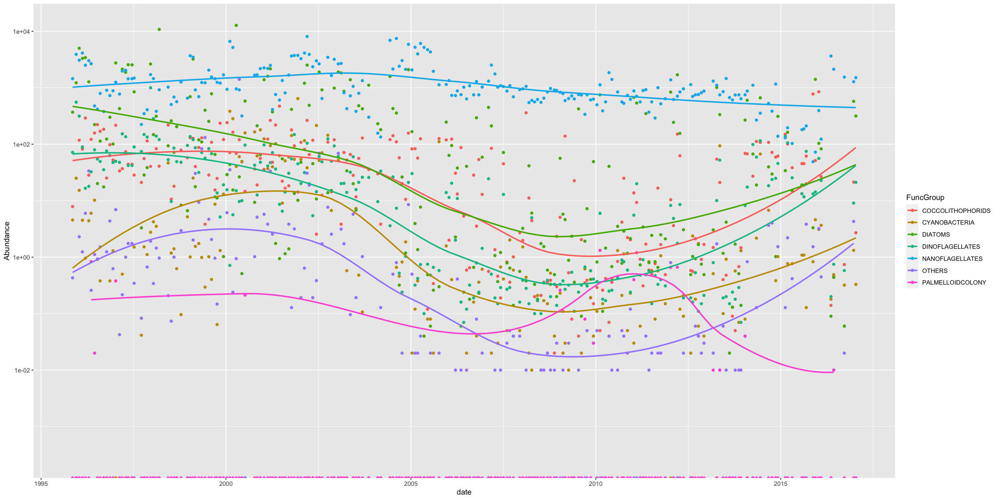

In [95]:
#sum up abundances per taxons for each date
dp2 <- ds_FG_cleaned %>% 
  group_by(date, FuncGroup) %>% 
  summarise(Abundance = sum(Total_sum)) 

## sum up total abundances per group per date
#dpGroupPerTime <- dp_filtered %>% 
#  group_by(date, group) %>% 
#  summarise(Abundance = sum(abundance)) 

#dpGroupPerDepthPerTime <- dp_filtered %>% 
#  group_by(date,depth, group) %>% 
#  summarise(Abundance = sum(abundance)) 

##plot all abundances per group per date
#dpGroupPerTime_notot <- dpGroupPerTime[!dpGroupPerTime$group=='TOTAL',]
options(repr.plot.width=20, repr.plot.height=10)
head(dp2)
ggplot(data=dp2,aes(x=date,y=Abundance,col=FuncGroup))+geom_point()+scale_y_log10()+ geom_smooth(fill=NA)#+scale_x_date(date_breaks = "1 year",date_labels='%Y')

#ggsave('Abundances.pdf', width=13, height= 5)

In [ ]:
- plot yearly dynamics
- plot seasonal dynamics of functional groups
- 

# NOW lets calculate some diversity metrics! with ds_FG_cleaned
start with Total_sum, and only later do depth integration

## -> need to flip the dataframe to have species as columns and abundances as rows!

to calcualte:
- number of species per day / year


In [190]:
#tail(ds_FG_cleaned[ds_FG_cleaned$ScientificName_accepted=="Akashiwo sanguinea",], n=50)

In [194]:
ds_wide <- ds_FG_cleaned %>%
    select(date, ScientificName_accepted, Total_sum) %>% 
    drop_na(date) %>%
    mutate(row = row_number()) %>%
    pivot_wider(names_from=ScientificName_accepted, values_from=Total_sum, id_cols=date, values_fill = NA, values_fn={mean}) 

ds_wide[is.na(ds_wide)] <- 0

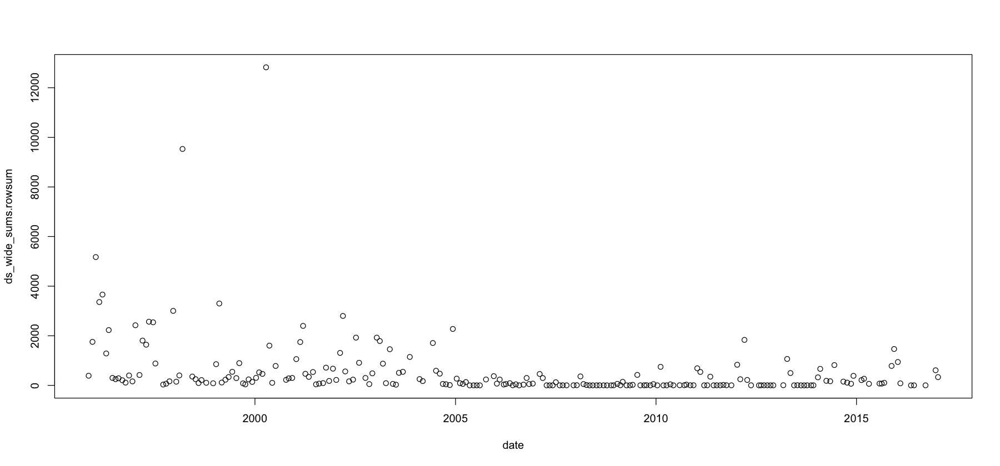

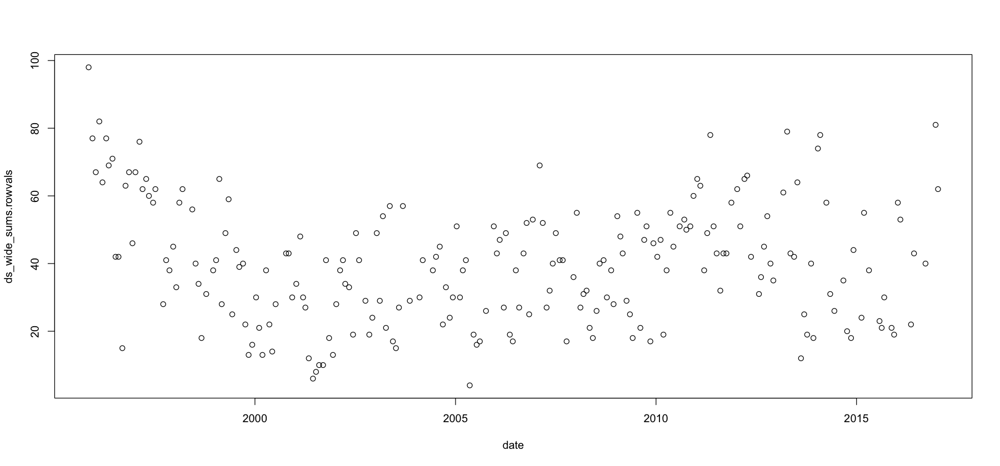

In [ ]:
ds_wide_sums <- ds_wide %>%
    select(-date,-nanoflagellates , -`palmelloid colony`) %>%
     mutate(rowsum = rowSums(.), rowvals = rowSums(. > 0))

plot(data.frame(date = ds_wide$date , ds_wide_sums$rowsum))

plot(data.frame(date = ds_wide$date , ds_wide_sums$rowvals))

In [224]:
library("vegan")

In [332]:
shannon_div <- ds_wide %>%
    select(-date, -nanoflagellates , -`palmelloid colony`) %>%
    diversity()

shannon_div = data.frame(date = ds_wide$date , shannon_div)

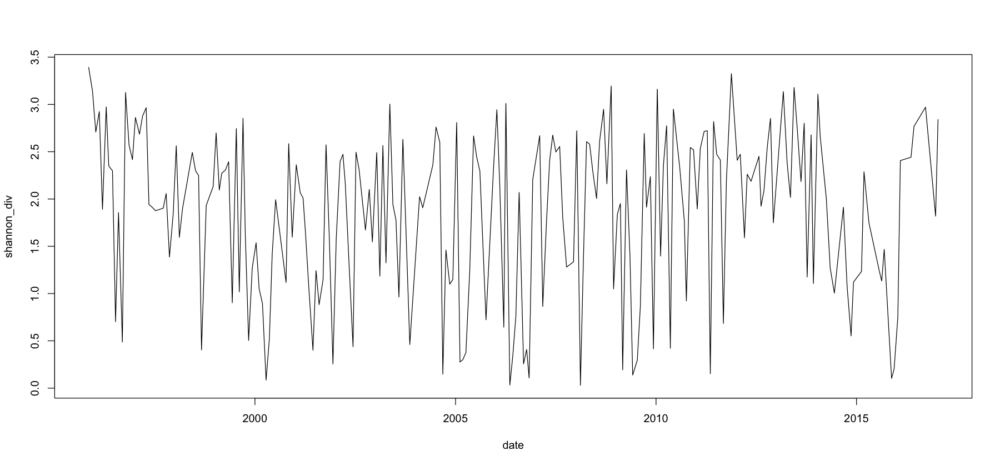

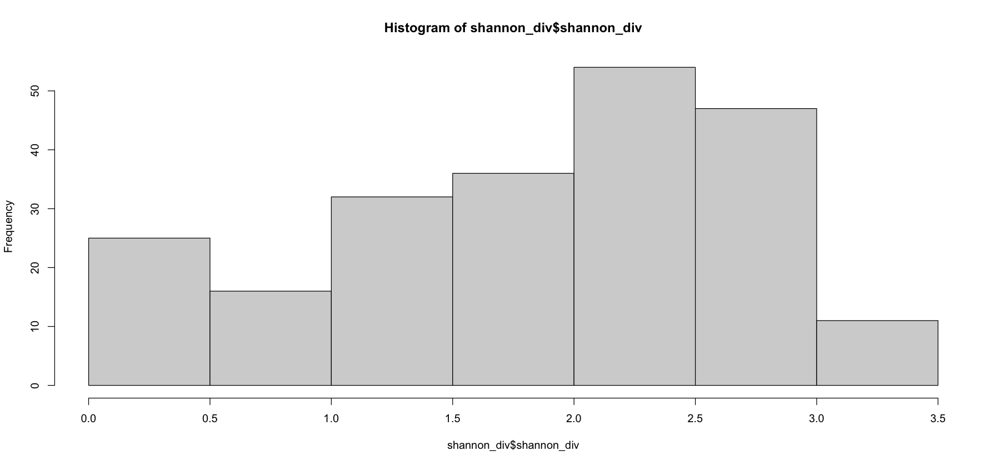

In [334]:
plot(shannon_div, type='l')
hist(shannon_div$shannon_div)

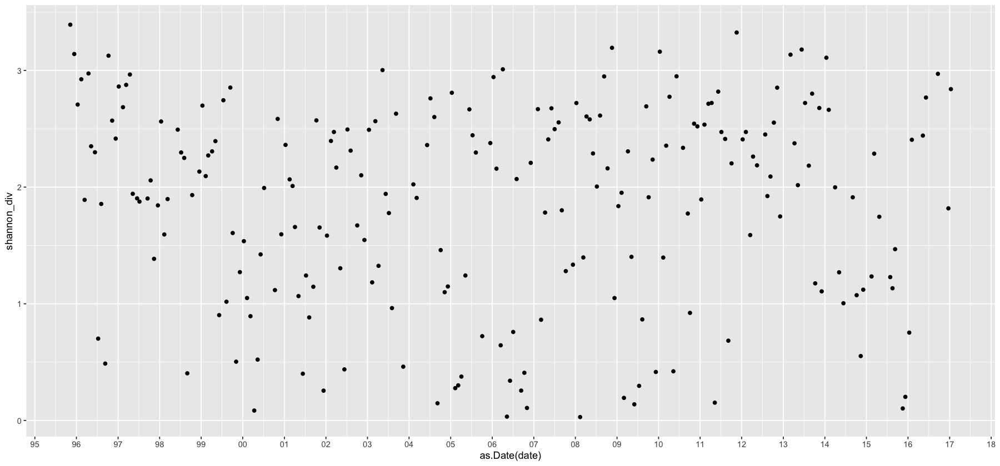

In [336]:
ggplot(data=shannon_div) + geom_point(aes(x = as.Date(date), y = shannon_div))+
      scale_x_date(date_breaks = "years" , date_labels = "%y")

# BRAY CURTIS

In [ ]:
ds_wide$`palmelloid colony`

[1] 0.4978452 0.6277192 0.5767488 0.5604833 0.5642636 0.5432470

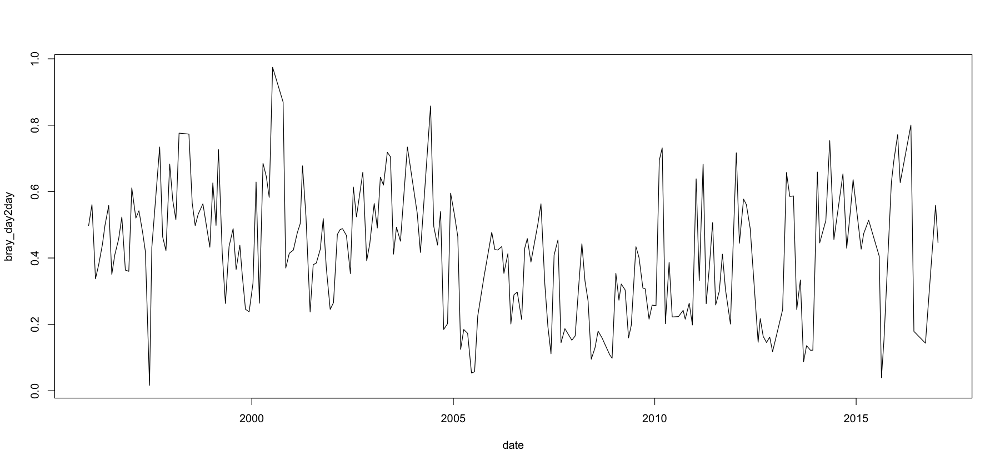

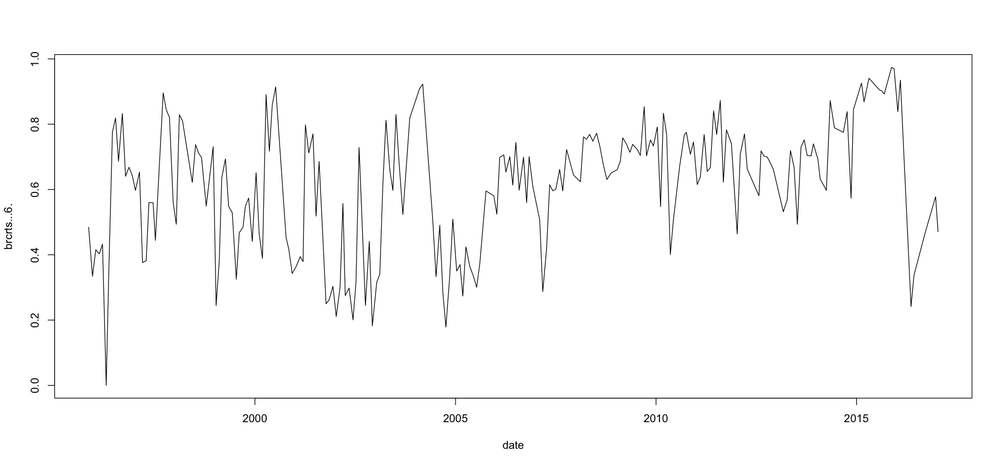

In [326]:
bray_curtis <- ds_wide %>%
    select(-date, -`palmelloid colony`) %>%
    sqrt() %>%
    vegdist(method="bray")#, binary=TRUE)

head(bray_curtis)

subdiag <- function (dist_obj, d) {
  if (!inherits(dist_obj, "dist")) stop("please provide a 'dist' object!")
  n <- attr(dist_obj, "Size")
  if (d < 1 || d > (n - 1)) stop(sprintf("'d' needs be between 1 and %d", n - 1L))
  j_1 <- c(0, seq.int(from = n - 1, by = -1, length = n - d - 1))
  subdiag_ind <- d + cumsum(j_1)
  dist_obj[subdiag_ind]
  }

br_curt_d2d = data.frame(date = ds_wide$date[-1], bray_day2day = subdiag(bray_curtis, 1))


br_curt_d1 = data.frame(date = ds_wide$date, brcrts[,6])

plot(br_curt_d2d, type='l')

plot(br_curt_d1, type='l')

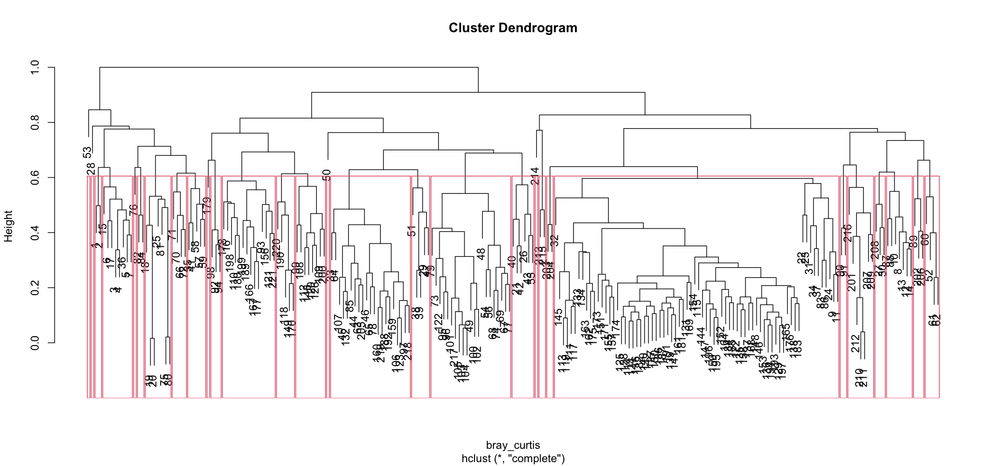

In [327]:
clus <- hclust(bray_curtis)
plot(clus)
rect.hclust(clus, h = 0.6)

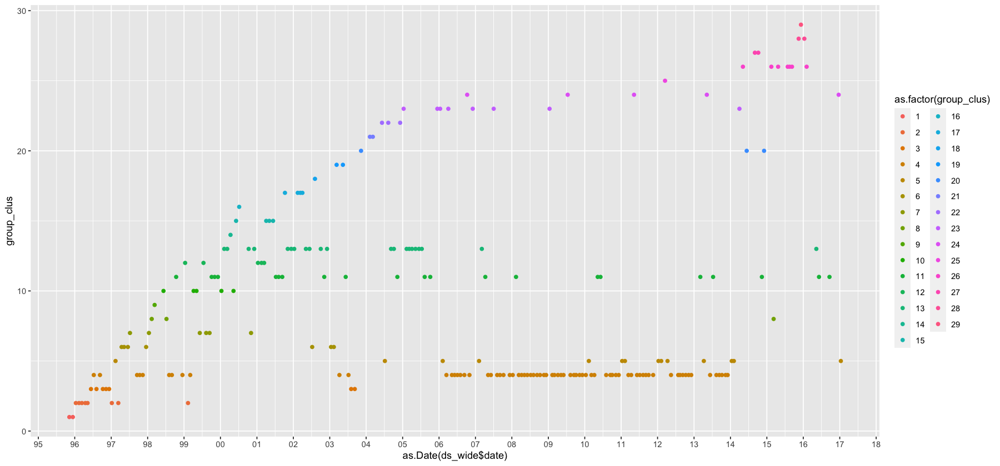

In [330]:
# extract groups with similarity > 0.6 between
group_clus <- cutree(clus, h=0.6)

ggplot() + geom_point(aes(x = as.Date(ds_wide$date), y = group_clus, col=as.factor(group_clus)))+
      scale_x_date(date_breaks = "years" , date_labels = "%y")


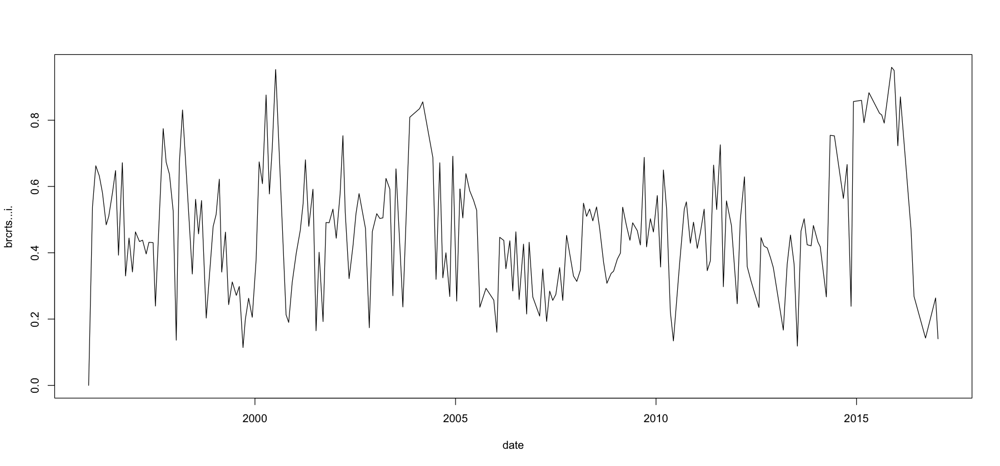

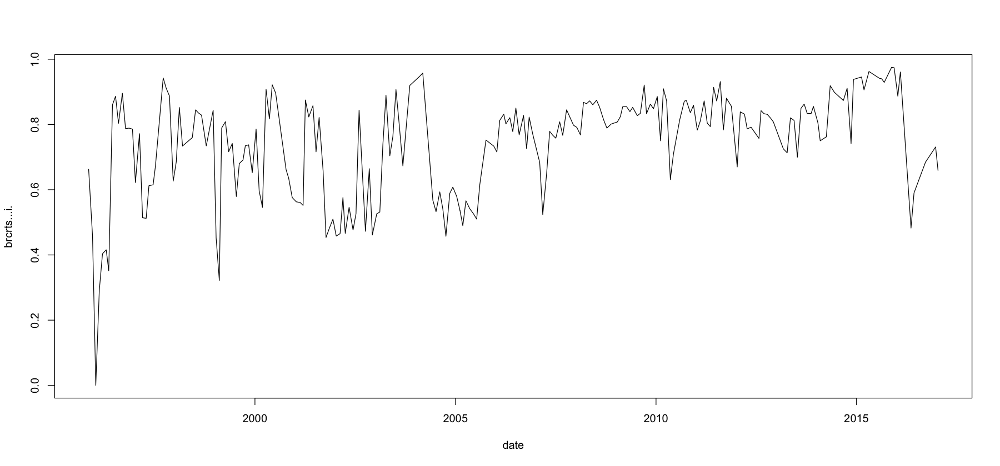

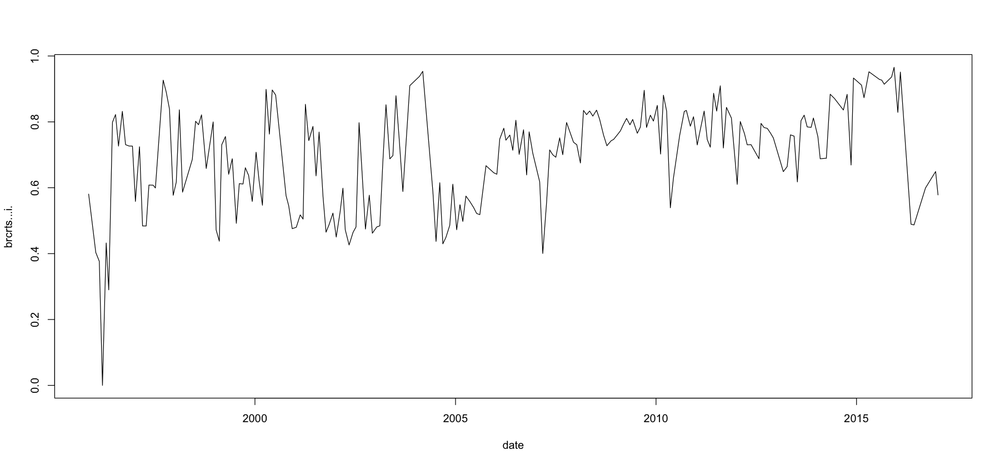

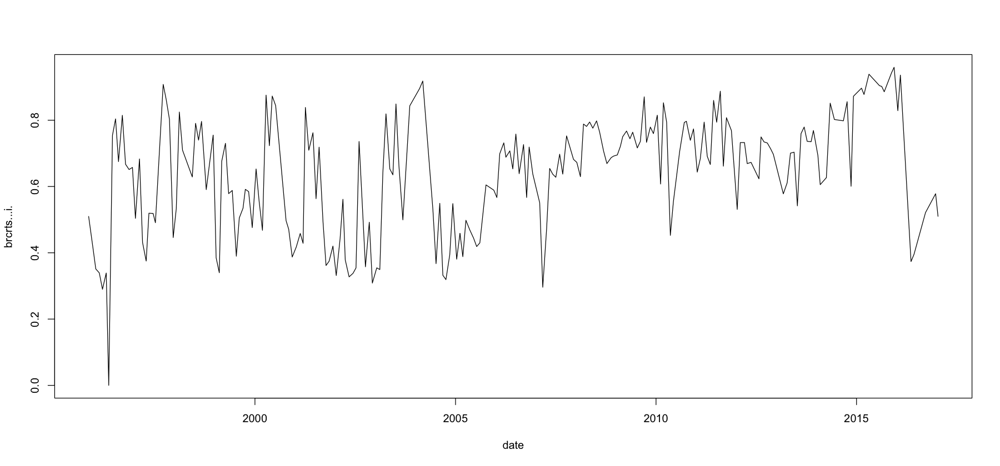

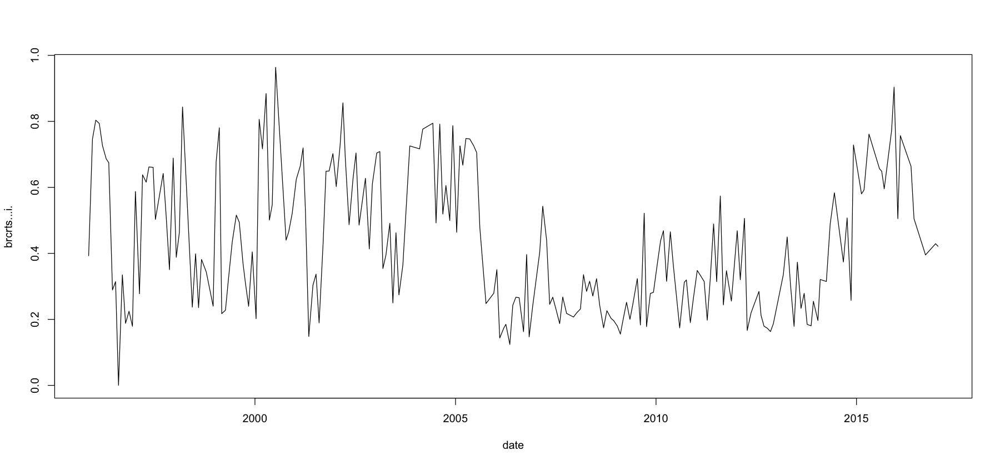

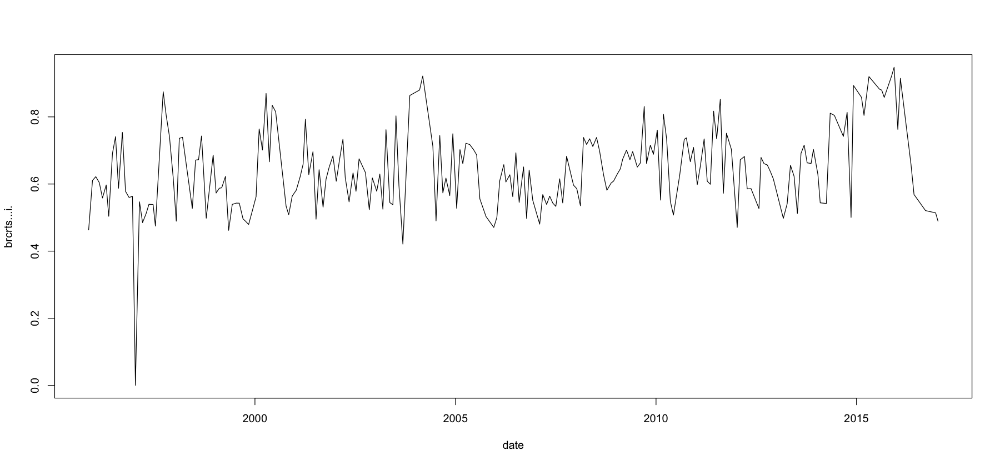

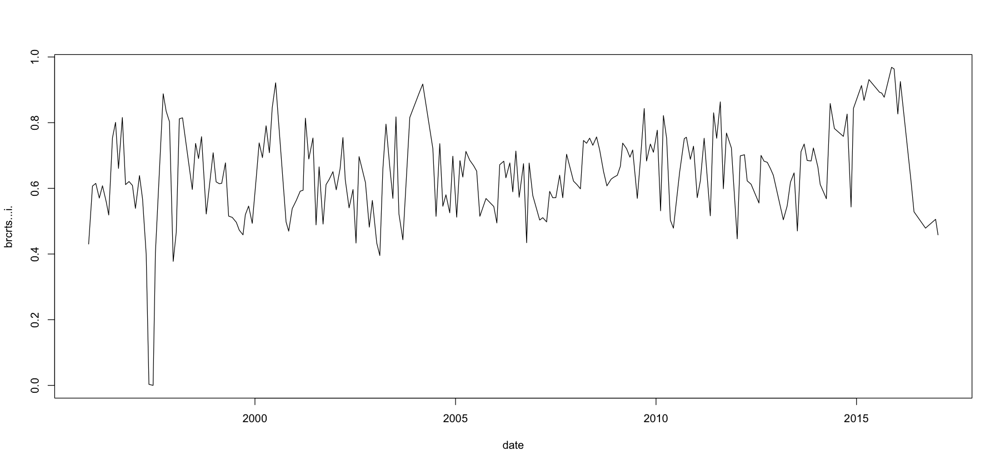

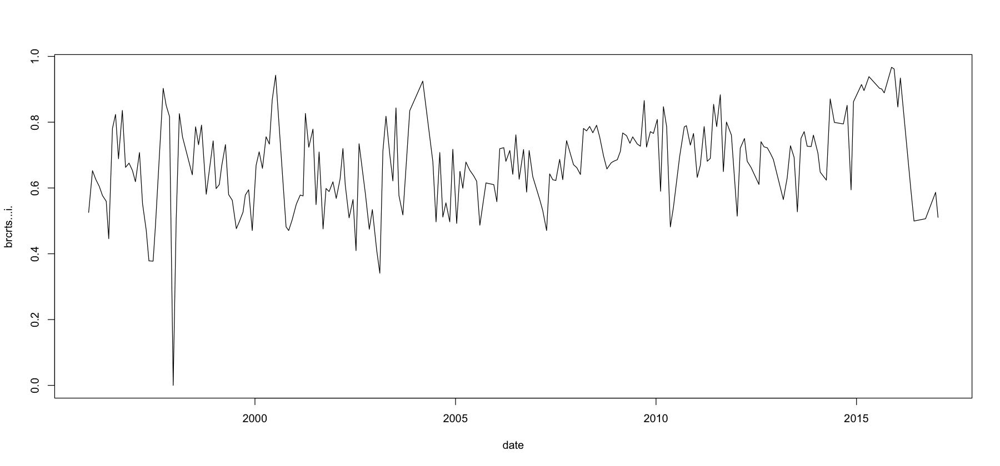

In [312]:
for (i in c(1,3,5,7,10,15,20,25)) {
    plot(data.frame(date = ds_wide$date, brcrts[,i]), type='l')}

In [263]:
brcrts = as.data.frame(as.matrix(bray_curtis))
brcrts[,1]

[1] 0.0000000 0.5386657 0.6624731 0.6319423 0.5806437 0.4843812 0.5096433
  [8] 0.5808876 0.6480127 0.3926875 0.6717004 0.3299969 0.4444453 0.3420888
 [15] 0.4630557 0.4338086 0.4379996 0.3964525 0.4315309 0.4304355 0.2391801
 [22] 0.7744544 0.6731153 0.6366509 0.5255470 0.1363100 0.6699645 0.8307967
 [29] 0.3358640 0.5613391 0.4570137 0.5575711 0.2030853 0.4794659 0.5155304
 [36] 0.6220004 0.3416805 0.4623627 0.2435531 0.3120390 0.2715144 0.2984487
 [43] 0.1140674 0.1990365 0.2628846 0.2053369 0.3775986 0.6741969 0.6084274
 [50] 0.8759597 0.5773655 0.7150650 0.9527905 0.2130315 0.1899055 0.3107569
 [57] 0.3994229 0.4668819 0.5474535 0.6805206 0.4797419 0.5916899 0.1648193
 [64] 0.4015729 0.1924469 0.4912162 0.4904871 0.5317457 0.4438557 0.5767796
 [71] 0.7531268 0.5207070 0.3219400 0.4223191 0.5184052 0.5785215 0.4740142
 [78] 0.1738268 0.4641451 0.5179819 0.5035106 0.5052437 0.6243344 0.5921947
 [85] 0.2703811 0.6532345 0.4746751 0.2365845 0.8089346 0.8347541 0.8552617
 [92] 0.6873923 0.3198794 0.6715372 0.3244057 0.3999690 0.2680406 0.6912584
 [99] 0.2541315 0.5921218 0.5050052 0.6387280 0.5868342 0.5581195 0.5280832
[106] 0.2356717 0.2927790 0.2570602 0.1601254 0.4466339 0.4372742 0.3517622
[113] 0.4361902 0.2847464 0.4632159 0.2591653 0.4260899 0.2152250 0.4316567
[120] 0.2668707 0.2089504 0.3511031 0.1928654 0.2843463 0.2565087 0.2741611
[127] 0.3553980 0.2561511 0.4525806 0.3297824 0.3136452 0.3480364 0.5495795
[134] 0.5099057 0.5320062 0.4962744 0.5382766 0.4738262 0.3713353 0.3078843
[141] 0.3378716 0.3443612 0.3808376 0.3989275 0.5374971 0.4806517 0.4376496
[148] 0.4903926 0.4666944 0.4234661 0.6877799 0.4177802 0.5027010 0.4626767
[155] 0.5726104 0.3570105 0.6498322 0.5316046 0.2219044 0.1339690 0.3699369
[162] 0.5313078 0.5535255 0.4287520 0.4922684 0.4132969 0.4596993 0.5315241
[169] 0.3459761 0.3753677 0.6645206 0.5304060 0.7257174 0.2975193 0.5565521
[176] 0.4830259 0.2462375 0.4986664 0.6290258 0.3583732 0.3143415 0.2349861
[183] 0.4456647 0.4202980 0.4144019 0.3850165 0.3550827 0.1667047 0.3650276
[190] 0.4535948 0.3660515 0.1184934 0.4655653 0.5027400 0.4242594 0.4209511
[197] 0.4823318 0.4323035 0.4183217 0.2673881 0.7542370 0.7526766 0.5638424
[204] 0.6663026 0.2385268 0.8563654 0.8597342 0.7922704 0.8828774 0.8209416
[211] 0.8157926 0.7911161 0.9594526 0.9501371 0.7227617 0.8703354 0.4705412
[218] 0.2684548 0.1427431 0.2637324 0.1404194

# Now let's plot some raw counts:

In [106]:
options(repr.plot.width=15, repr.plot.height=7)

Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 2 rows containing missing values (geom_point).”


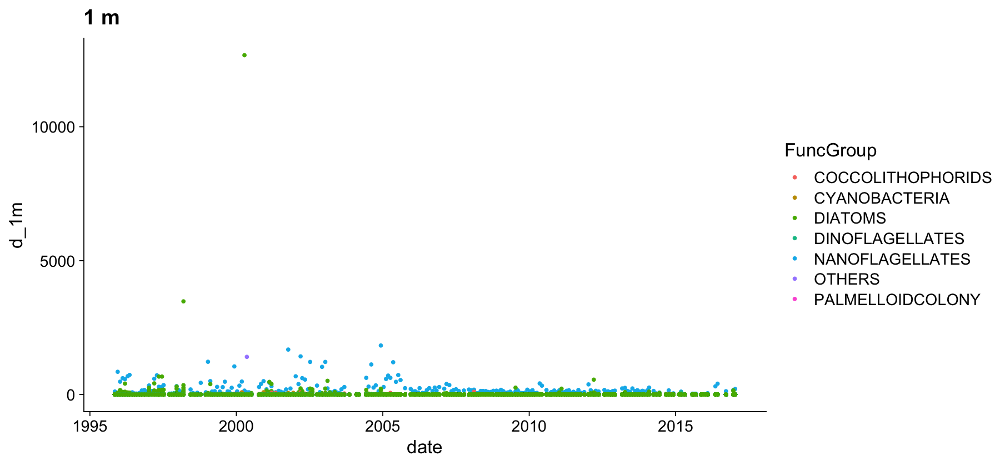

Warning message:
“Removed 1 rows containing missing values (geom_point).”


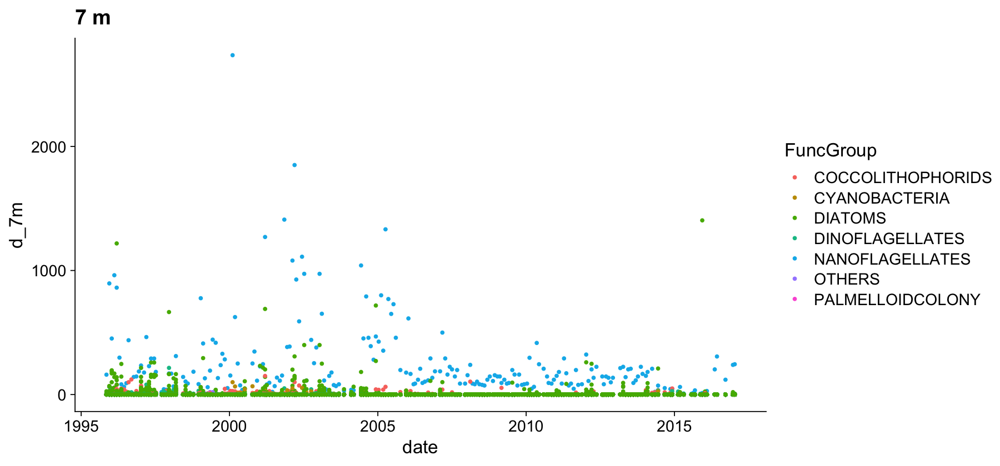

Warning message:
“Removed 1 rows containing missing values (geom_point).”


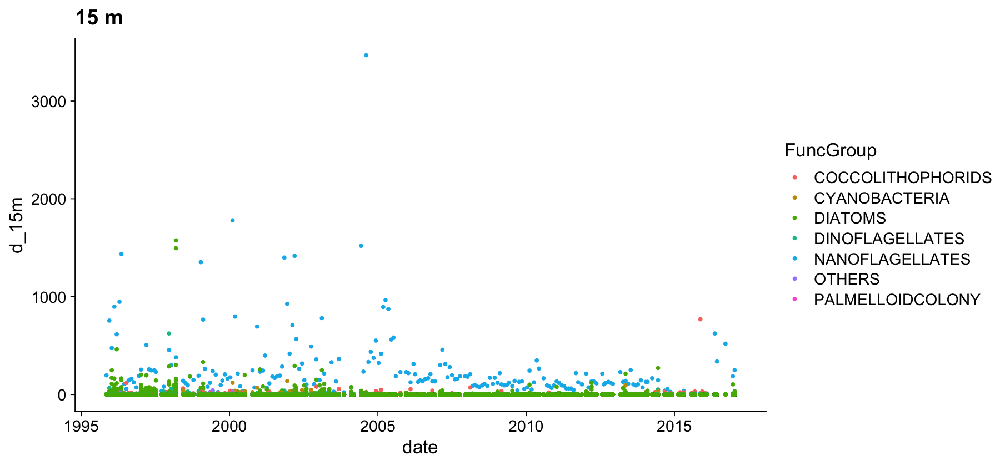

Warning message:
“Removed 1 rows containing missing values (geom_point).”


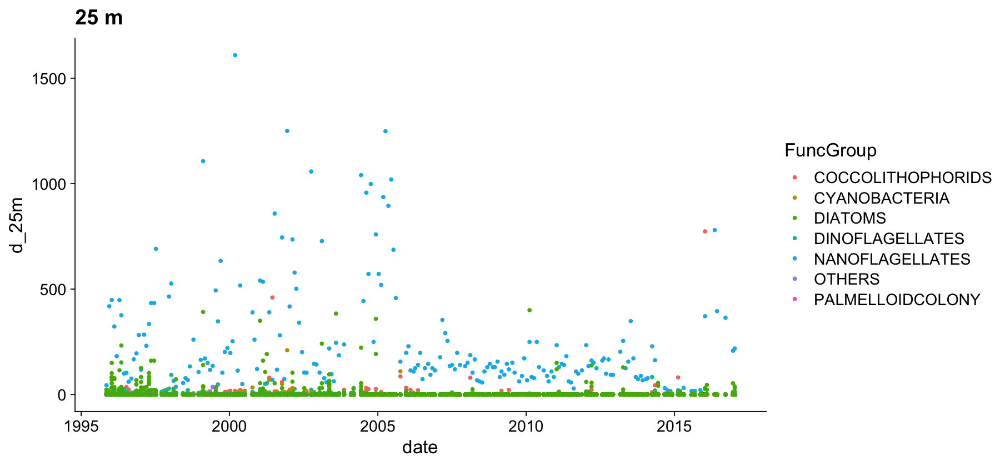

Warning message:
“Removed 1 rows containing missing values (geom_point).”


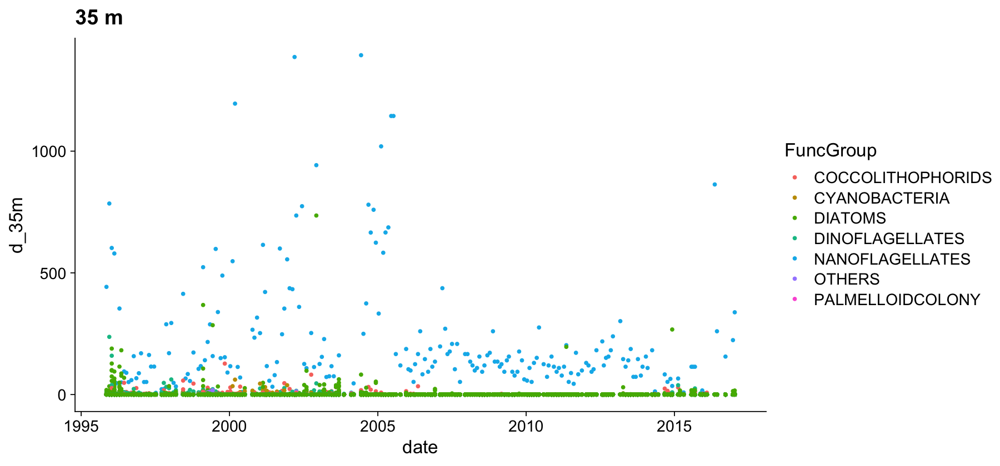

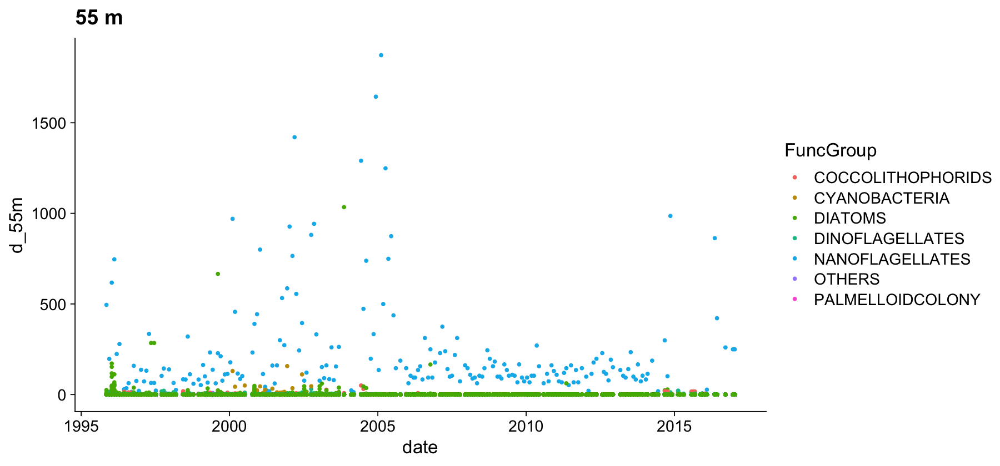

In [116]:
ggplot(data=ds_FG_cleaned, aes(x=date, y=d_1m, color=FuncGroup)) + geom_point() + theme_cowplot(font_size=20)+
ggtitle("1 m")

ggplot(data=ds_FG_cleaned, aes(x=date, y=d_7m, color=FuncGroup)) + geom_point() + theme_cowplot(font_size=20)+
ggtitle("7 m")

ggplot(data=ds_FG_cleaned, aes(x=date, y=d_15m, color=FuncGroup)) + geom_point() + theme_cowplot(font_size=20)+
ggtitle("15 m")

ggplot(data=ds_FG_cleaned, aes(x=date, y=d_25m, color=FuncGroup)) + geom_point() + theme_cowplot(font_size=20)+
ggtitle("25 m")

ggplot(data=ds_FG_cleaned, aes(x=date, y=d_35m, color=FuncGroup)) + geom_point() + theme_cowplot(font_size=20)+
ggtitle("35 m")

ggplot(data=ds_FG_cleaned, aes(x=date, y=d_55m, color=FuncGroup)) + geom_point() + theme_cowplot(font_size=20)+
ggtitle("55 m")

In [14]:
blob <- rbind(data.frame(val=ds_FG$d_1m, depth=1, date=ds_FG$date, AphiaID=ds_FG$AphiaID , FuncGroup=ds_FG$FuncGroup),
      data.frame(val=ds_FG$d_7m, depth=7, date=ds_FG$date, AphiaID=ds_FG$AphiaID, FuncGroup=ds_FG$FuncGroup),
      data.frame(val=ds_FG$d_15m, depth=15, date=ds_FG$date, AphiaID=ds_FG$AphiaID, FuncGroup=ds_FG$FuncGroup),
      data.frame(val=ds_FG$d_25m, depth=25, date=ds_FG$date, AphiaID=ds_FG$AphiaID, FuncGroup=ds_FG$FuncGroup),
      data.frame(val=ds_FG$d_55m, depth=55, date=ds_FG$date, AphiaID=ds_FG$AphiaID, FuncGroup=ds_FG$FuncGroup),
      data.frame(val=ds_FG$d_75m, depth=75, date=ds_FG$date, AphiaID=ds_FG$AphiaID, FuncGroup=ds_FG$FuncGroup),
      data.frame(val=ds_FG$d_100m, depth=100, date=ds_FG$date, AphiaID=ds_FG$AphiaID, FuncGroup=ds_FG$FuncGroup))

In [23]:
#blob

In [24]:
func_group_key = unique(blob[,c('AphiaID', 'FuncGroup')])

In [25]:
# Function to read specific functionial type from dataset

prepdataframe <- function(funcgroup='', datasource='blob'){
    if(datasource=='blob'){
    DF <- blob
    #print(names(DF))
    
    DF_FG <- DF %>%
     filter(FuncGroup == funcgroup)
    
    VarDF <- DF_FG %>%
      select(date, val, depth) %>%
      gather(key='key',value = "value", -date, -depth)
    #head(VarDF)
    }
    
    return(VarDF)
}

In [26]:
# Interpolate
interpolateDF <- function(DF,func='linear'){
    zz <- seq(0, 100, 1)
    
    if(func=='linear'){
        IntDF <- DF %>%
            group_by(date) %>%
            filter(sum(!is.na(value))>1) %>%
            do(data.frame(value_int = with(.,approx(depth, value, zz)), depth = zz)) 
        
        IntDF <- IntDF %>% 
              rename(
                value_int = value_int.y
                )
        IntDF$value_int.x <- NULL
        }
    
    return(IntDF)
}

In [27]:
#diatoms <- prepdataframe("DIATOMS")

In [28]:

getfuncgroupint <- function(funcgroup){
    
        fg_dat <- prepdataframe(funcgroup)

        fg_dat_int <- interpolateDF(fg_dat)

        fg_dat_sum <- fg_dat_int %>%
            group_by(date) %>%
            filter(depth<101) %>%
            filter(sum(is.na(value_int))<20) %>%
            summarize(#value_sum = sum(value_int, na.rm=TRUE), 
                      value_mean = mean(value_int, na.rm=TRUE),
                      #value_intgrtd = value_mean * 100,
                      #NAs = sum(is.na(value_int)), .groups="keep"
            )   

    return(fg_dat_sum)
}

In [29]:
defaultW <- getOption("warn")
options(warn = -1)


diatoms_sum <- getfuncgroupint("DIATOMS")

#dino_sum <- getfuncgroupint("DINOFLAGELLATES")

#cyano_sum <- getfuncgroupint("CYANOBACTERIA")

#nano_sum <- getfuncgroupint("NANOFLAGELLATES")

In [30]:
# check magnitude, use the same values as legacy papaer

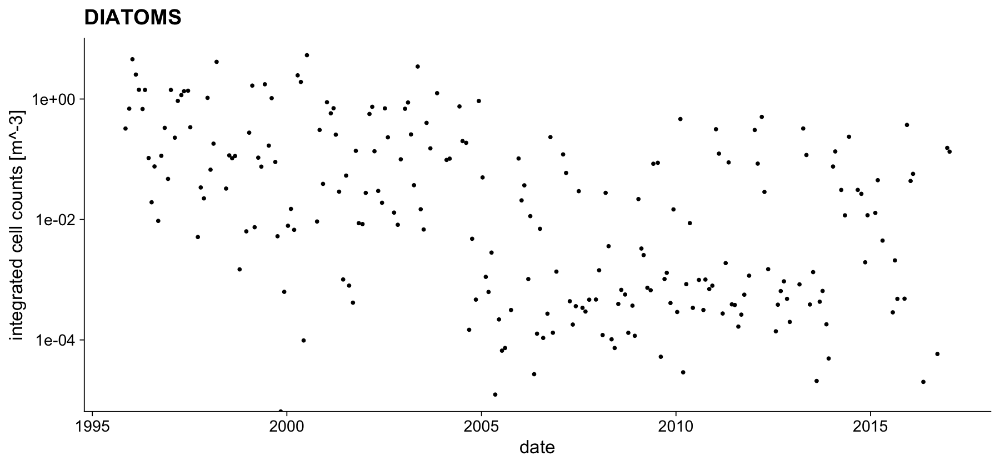

In [31]:
ggplot(data=diatoms_sum, aes(x=date, y=value_mean)) + geom_point() + theme_cowplot(font_size=20)+
 ggtitle("DIATOMS") + ylab("integrated cell counts [m^-3]") + scale_y_log10()

In [32]:
#diatoms_sum

In [33]:
FuncGroups = unique(AphiaID2FG$FuncGroup)

fgnum = length(FuncGroups)

# Create Dataframe of Integrated Counts per Func Group

In [34]:
fg_intmean_dat <- getfuncgroupint(FuncGroups[1])
names(fg_intmean_dat)[2] <- FuncGroups[1]

#print(head(fg_intmean_dat))
#print(names(fg_intmean_dat))

for (i in 2:fgnum){
    print(paste(i, "FuncGroup: ", FuncGroups[i]))
    fg_intmean_dat <- left_join(fg_intmean_dat, getfuncgroupint(FuncGroups[i]), by = "date")
    #print(head(fg_intmean_dat))
    #print(names(fg_intmean_dat))
    names(fg_intmean_dat)[1+i] <- FuncGroups[i]
}

[1] "2 FuncGroup:  DIATOMS"
[1] "3 FuncGroup:  DINOFLAGELLATES"
[1] "4 FuncGroup:  CYANOBACTERIA"
[1] "5 FuncGroup:  OTHERS"
[1] "6 FuncGroup:  NANOFLAGELLATES"


In [35]:
#write.csv(fg_intmean_dat, "IntegratedPhytoplanktonFuncGroupCounts.csv")

# GET PRESENCE PER CRUISE PER APHIA ID

In [36]:
# function to read specific aphia id identified from dataset

prepdataframe_APHIA <- function(aphia_id='', datasource='blob'){
    if(datasource=='blob'){
    DF <- blob
    #print(names(DF))
    
    DF_FG <- DF %>%
     filter(AphiaID == aphia_id)
    
    VarDF <- DF_FG %>%
      select(date, val, depth) %>%
      gather(key='key',value = "value", -date, -depth)
    #head(VarDF)
    }
    
    return(VarDF)
}

In [37]:
head(prepdataframe_APHIA(17657))

,date,depth,key,value
,<dttm>,<dbl>,<chr>,<dbl>
1,2007-05-08 09:06:00,1,val,0
2,2006-10-10 09:13:00,1,val,0
3,2012-11-08 09:19:00,1,val,0
4,2004-02-08 08:29:00,1,val,0
5,2011-07-07 08:57:00,1,val,0
6,2012-04-10 09:11:00,1,val,0


In [40]:
head(getAPHIAint(17657))

date,value_sum
<dttm>,<dbl>
1999-07-15 09:36:00,0.00
1999-08-11 09:25:00,1.26
2000-07-07 10:03:00,0.00
2001-02-16 10:35:00,0.00
2001-03-14 10:28:00,0.00
2001-04-04 09:45:00,0.00


In [41]:
# get interpolated presences for specific AphiaID
getAPHIAint <- function(aphia_id){
    
        ap_dat <- prepdataframe_APHIA(aphia_id)

        ap_dat_int <- interpolateDF(ap_dat)

        ap_dat_sum <- ap_dat_int %>%
            group_by(date) %>%
            filter(depth<101) %>%
            filter(sum(is.na(value_int))<20) %>%
            summarize(value_sum = sum(value_int, na.rm=TRUE), 
                      #value_mean = mean(value_int, na.rm=TRUE),
                      #value_intgrtd = value_mean * 100,
                      #NAs = sum(is.na(value_int)), .groups="keep"
            )   

    return(ap_dat_sum)
}

In [42]:
AphiaIDs <- unique(blob[blob$AphiaID>1,]$AphiaID)

apnum = length(AphiaIDs)

In [43]:
ap_intmean_dat <- getAPHIAint(AphiaIDs[1])
names(ap_intmean_dat)[2] <- AphiaIDs[1]

#print(head(fg_intmean_dat))
#print(names(fg_intmean_dat))

for (i in 2:apnum){
    #print(paste(i, "AphiaID: ", AphiaIDs[i]))
    ap_intmean_dat <- left_join(ap_intmean_dat, getAPHIAint(AphiaIDs[i]), by = "date")
    #print(head(fg_intmean_dat))
    #print(names(fg_intmean_dat))
    names(ap_intmean_dat)[1+i] <- AphiaIDs[i]
}

In [44]:
#ap_intmean_dat

In [45]:
spec_ric_dat <- ap_intmean_dat %>%
    pivot_longer(!date, names_to='AphiaID', values_to='values_sum' ) %>%
    group_by(date) %>%
    mutate(presence = values_sum > 0 & !is.na(values_sum)) %>%
    summarize(species_richness=sum(presence))

In [46]:
#write.csv(spec_ric_dat, "IntegratedPhytoplanktonSpeciesRichnessEstimate.csv")

In [48]:
#spec_ric_dat

# Try to get richness per func group

In [64]:
for (i in 100:101){
    a = func_group_key[func_group_key$AphiaID==Aphia_dailysum_dat$AphiaID[i],]$FuncGroup
    print(a)
    }

[1] "DINOFLAGELLATES"
[1] "DINOFLAGELLATES"


In [73]:
Aphia_dailysum_dat <- ap_intmean_dat %>%
    pivot_longer(!date, names_to='AphiaID', values_to='values_sum' ) %>%
    group_by(date) #%>%
    #mutate(across(func_group_key$FuncGroup==AphiaID ))#func_group_key[func_group_key$AphiaID==AphiaID,]$FuncGroup) #%>%
    #summarize(species_richness=sum(presence))

In [83]:
head(Aphia_dailysum_dat)

date,AphiaID,values_sum
<dttm>,<chr>,<dbl>
1995-11-08 07:36:00,801,0
1995-11-08 07:36:00,17657,NA
1995-11-08 07:36:00,106283,NA
1995-11-08 07:36:00,106285,NA
1995-11-08 07:36:00,106289,NA
1995-11-08 07:36:00,106314,NA


In [85]:
FuncAphia_dat <- Aphia_dailysum_dat %>%
    group_by(AphiaID) %>%
    mutate(FuncGroup = func_group_key[func_group_key$AphiaID==AphiaID,]$FuncGroup) %>%
    ungroup() 

In [91]:
FuncGroup_SpeciesRichness <- FuncAphia_dat %>%
    group_by(date, FuncGroup) %>%
    mutate(presence = values_sum > 0 & !is.na(values_sum)) %>%
    summarize(species_richness=sum(presence)) %>%
    pivot_wider(names_from = FuncGroup, values_from = species_richness)

`summarise()` has grouped output by 'date'. You can override using the `.groups` argument.



In [92]:
write.csv(FuncGroup_SpeciesRichness,"IntegratedPhytoplanktonFuncGroupSpeciesRichness.csv")